In [1]:
! nvidia-smi

Wed Apr 17 16:41:50 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [5]:
! pip install --upgrade torchaudio torchtext torchvision

In [6]:
! pip install peft xformers bitsandbytes transformers accelerate -q

In [7]:
! pip install git+https://github.com/huggingface/diffusers.git -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [10]:
! wget https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora.py

--2024-04-17 16:50:27--  https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 57403 (56K) [text/plain]
Saving to: ‘train_dreambooth_lora.py’

train_dreambooth_lo 100%[===================>]  56.06K  --.-KB/s    in 0.007s  

2024-04-17 16:50:27 (7.79 MB/s) - ‘train_dreambooth_lora.py’ saved [57403/57403]



**DATASET**

In [8]:
DATASET_FOLDER_NAME = "fotos"  # Complete with your own dataset folder name

In [9]:
from PIL import Image

def image_grid(imgs, rows, cols, resize=256):
    assert len(imgs) == rows * cols

    if resize is not None:
        imgs = [img.resize((resize, resize)) for img in imgs]
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

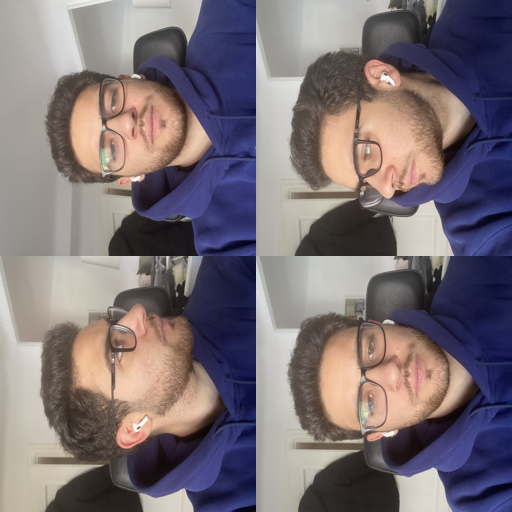

In [10]:
import glob

imgs = [Image.open(path) for path in glob.glob(f"./{DATASET_FOLDER_NAME}/*.jpg")][:10]
image_grid(imgs, 2, 2)

## Prep for training 💻

In [11]:
! accelerate config default

Configuration already exists at /root/.cache/huggingface/accelerate/default_config.yaml, will not override. Run `accelerate config` manually or pass a different `save_location`.


## Imports

In [12]:
from diffusers import AutoPipelineForText2Image
from diffusers import EulerAncestralDiscreteScheduler
import torch

import warnings
warnings.filterwarnings('ignore')

In [13]:
! wget https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora_sdxl.py

--2024-04-17 18:45:12--  https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora_sdxl.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 84307 (82K) [text/plain]
Saving to: ‘train_dreambooth_lora_sdxl.py.1’

train_dreambooth_lo 100%[===================>]  82.33K  --.-KB/s    in 0.008s  

2024-04-17 18:45:13 (10.0 MB/s) - ‘train_dreambooth_lora_sdxl.py.1’ saved [84307/84307]



In [14]:
! accelerate launch train_dreambooth_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --pretrained_vae_model_name_or_path="madebyollin/sdxl-vae-fp16-fix" \
  --instance_data_dir="./fotos" \
  --output_dir="my_lora_xl_model" \
  --mixed_precision="fp16" \
  --instance_prompt="a photo of sks person" \
  --resolution=1024 \
  --train_batch_size=2 \
  --gradient_accumulation_steps=2 \
  --gradient_checkpointing \
  --learning_rate=1e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --use_8bit_adam \
  --max_train_steps=500 \
  --checkpointing_steps=717 \
  --seed=1234

# --enable_xformers_memory_efficient_attention \

2024-04-17 18:45:24.065884: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 18:45:24.065955: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 18:45:24.067828: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-17 18:45:26.254246: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
04/17/2024 18:45:28 - INFO - __main__ - Distributed environment: NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: fp16

You are using a model of type clip_text_model to instantiate a model of ty

In [15]:
from diffusers import DiffusionPipeline
import torch

from diffusers import DiffusionPipeline, AutoencoderKL

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae, torch_dtype=torch.float16, variant="fp16",
    use_safetensors=True
).to("cuda")

pipe.load_lora_weights("my_lora_xl_model")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [16]:
pipe.scheduler=EulerAncestralDiscreteScheduler.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", subfolder="scheduler")

**CREAR IMAGENES**

  0%|          | 0/50 [00:00<?, ?it/s]

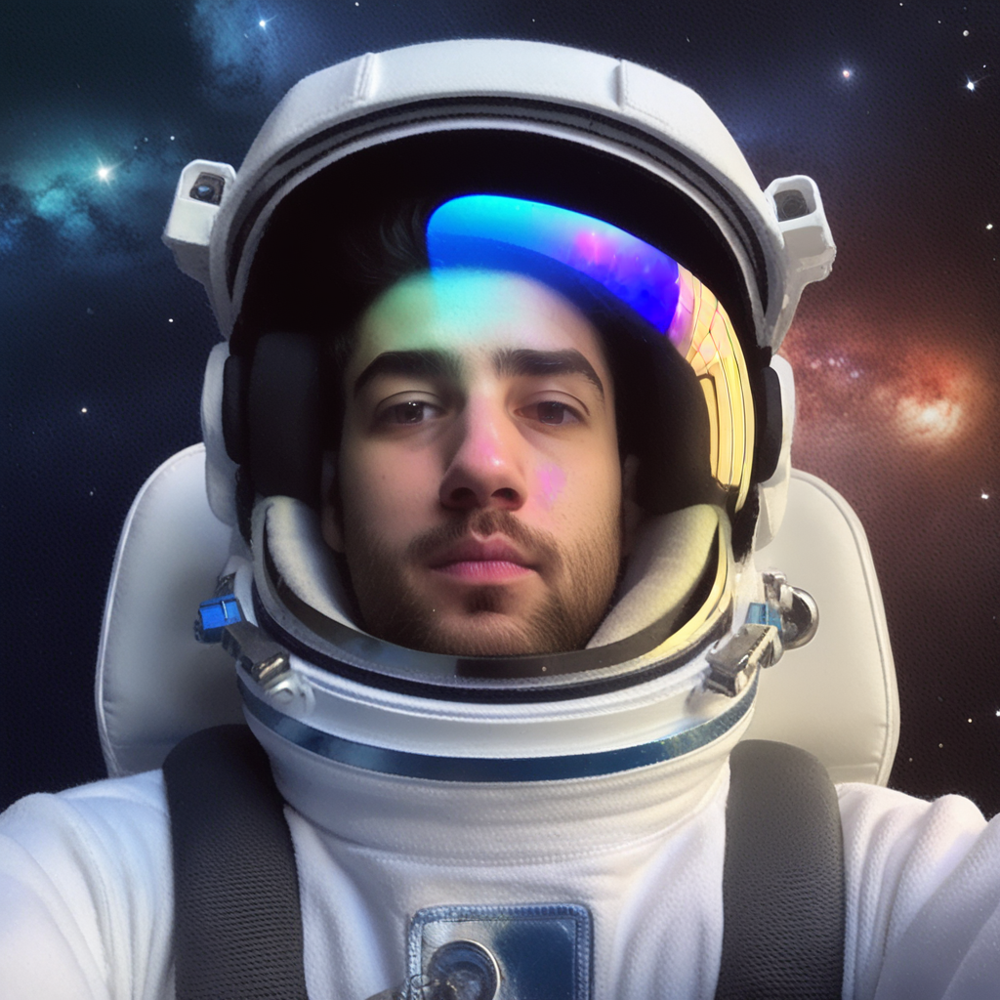

In [17]:
image = pipe("My face on an astronaut floating amidst vibrant galaxies and comets, ultradefined textures of the suit against the dark cosmos.", guidance_scale=7.5, num_inference_steps=50).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

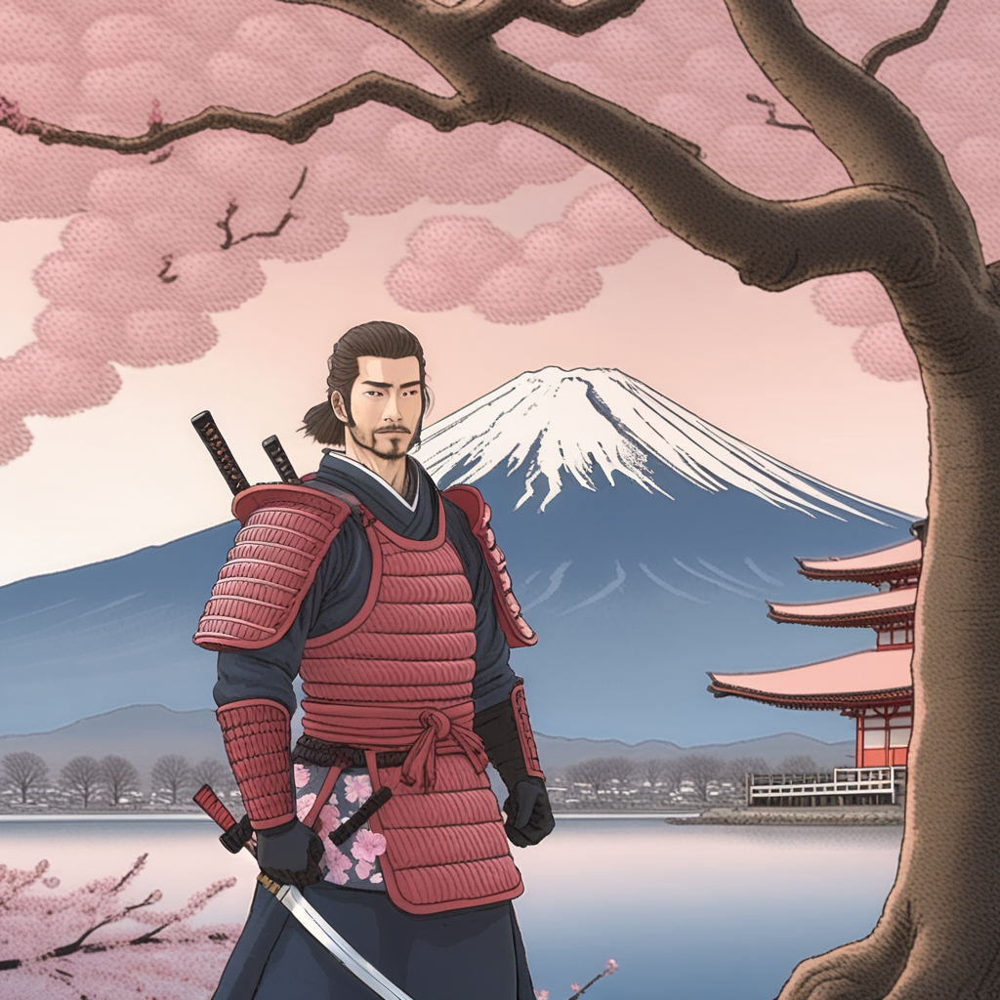

In [18]:
image = pipe("Me as a samurai in ancient Japan, detailed armor, standing under cherry blossoms, Mt. Fuji in the backdrop, ultra-defined and dynamic.", guidance_scale=7.5, num_inference_steps=50).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

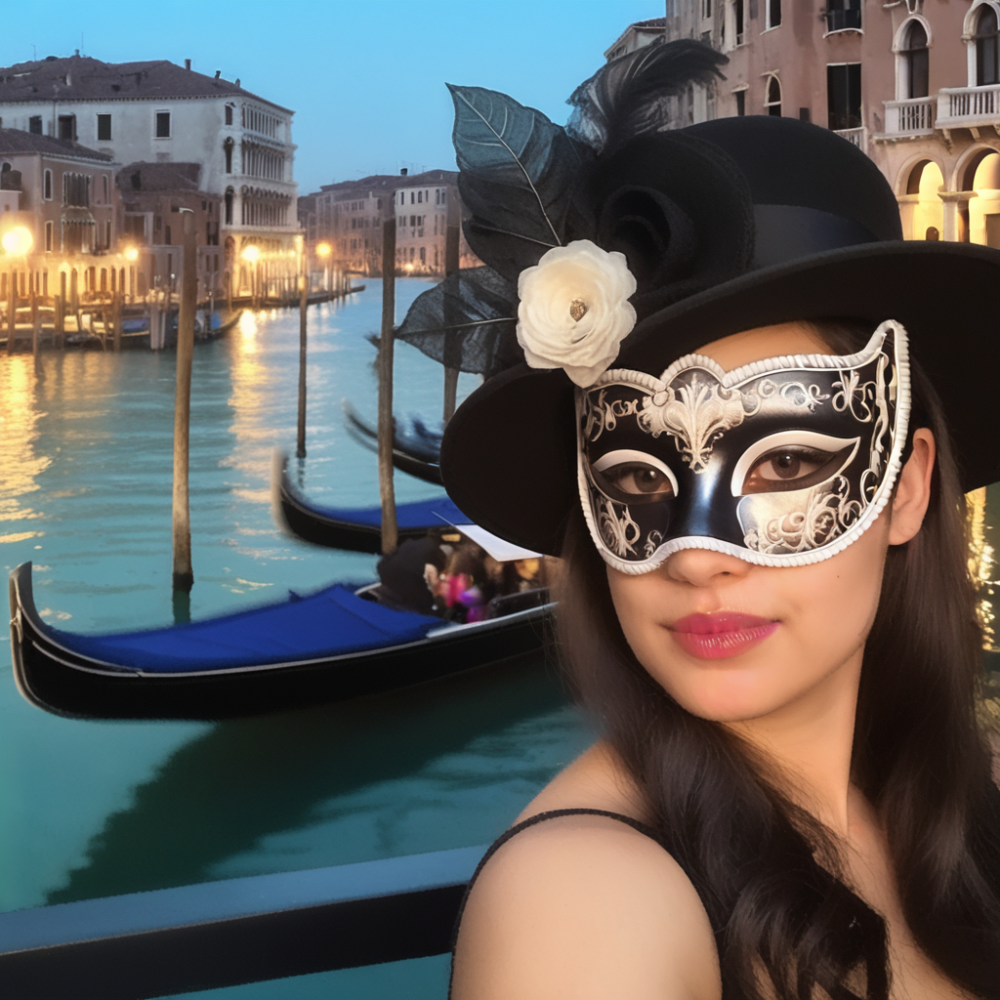

In [19]:
image = pipe("Portrait of me as a Venetian masquerade attendee, intricate mask details, the Grand Canal at dusk, ultrarefined elegance.", guidance_scale=7.5, num_inference_steps=50).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

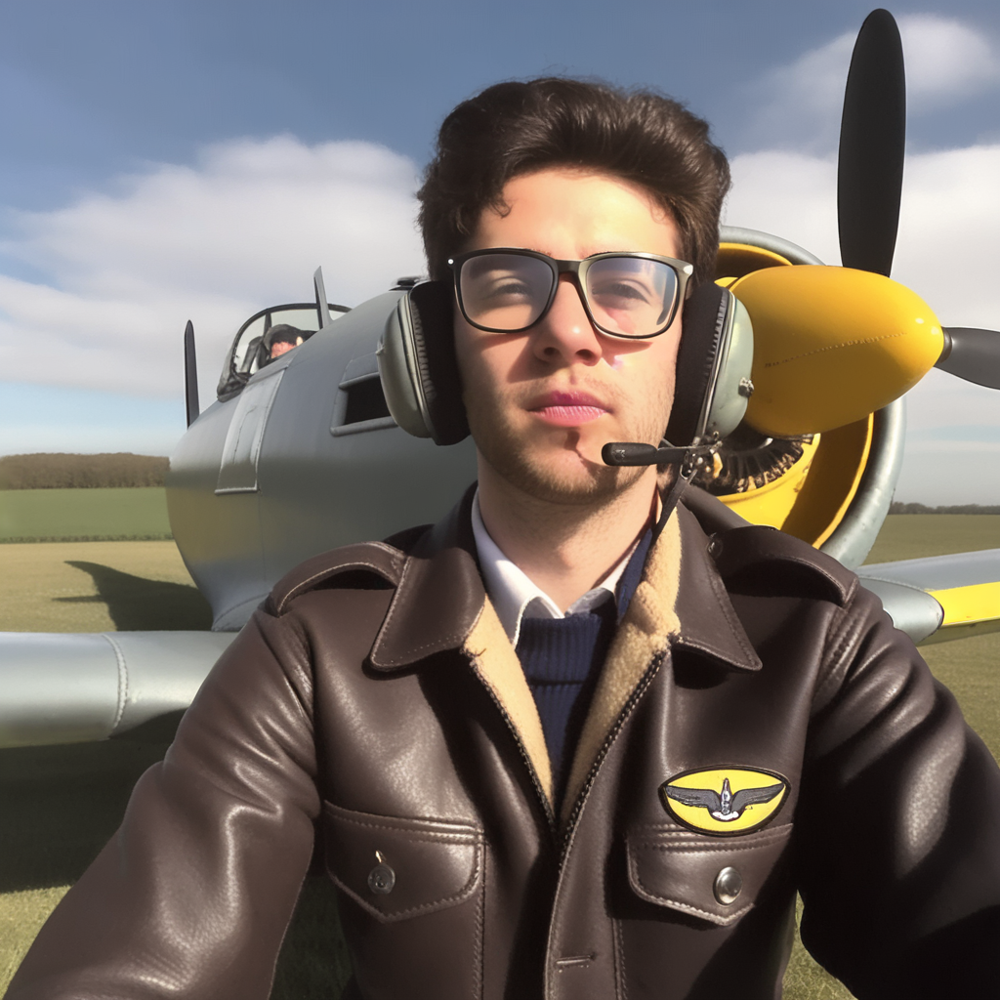

In [20]:
image = pipe("Me as a pilot from the 1940s, leather jacket detailed, in front of a Spitfire, clear skies ahead, high-definition.", guidance_scale=7.5, num_inference_steps=50).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

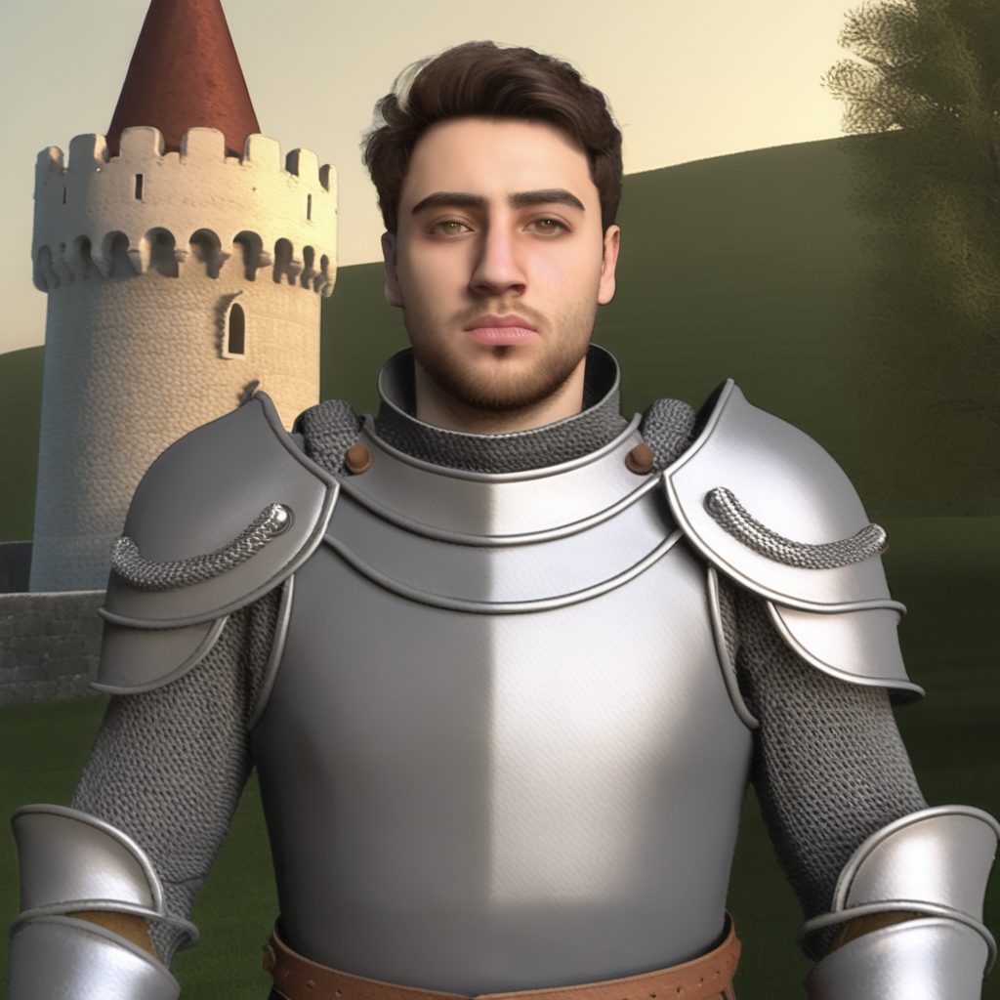

In [21]:
image = pipe("My face on a medieval knight in armor, detailed chainmail, holding a sword, ancient castle in the background, ultradefined.", guidance_scale=7.5, num_inference_steps=50).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

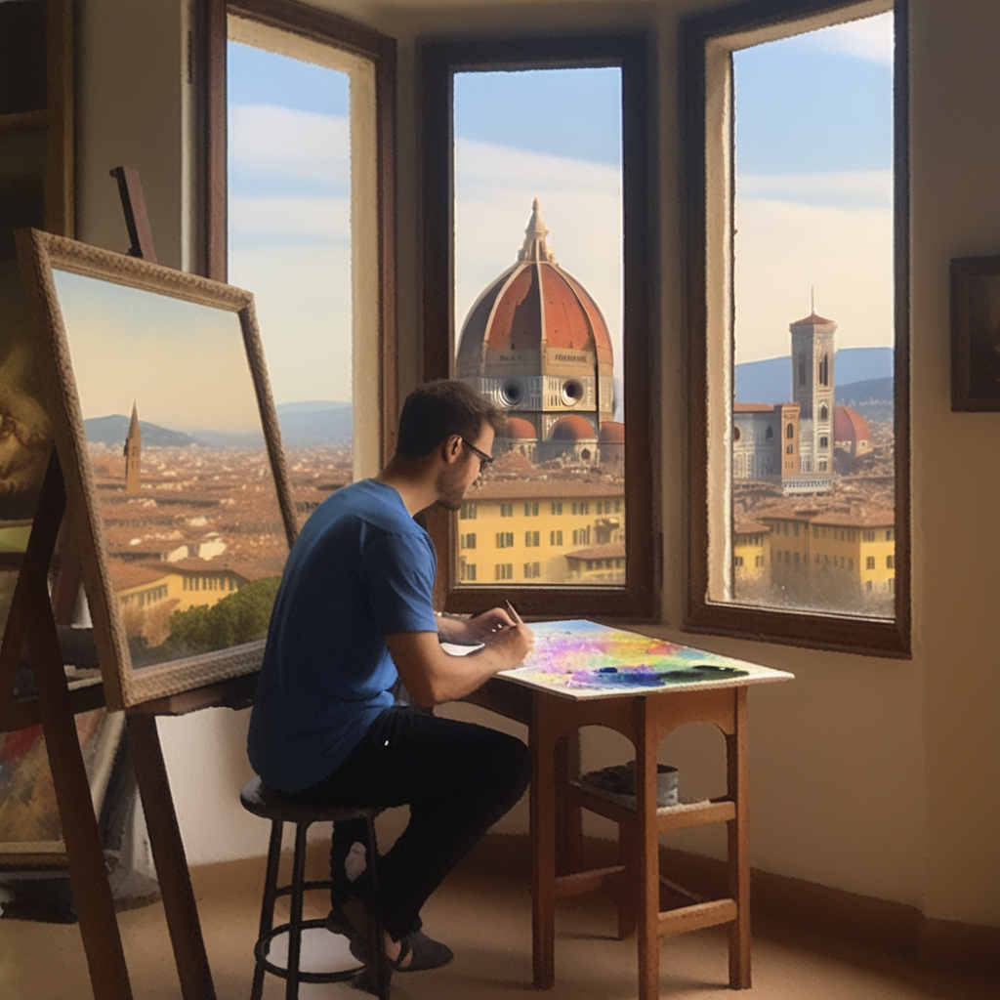

In [22]:
image = pipe("Me as a Renaissance painter, detailed studio with vibrant paints and canvases, Florence cityscape through the window, high clarity.", guidance_scale=7.5, num_inference_steps=50).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

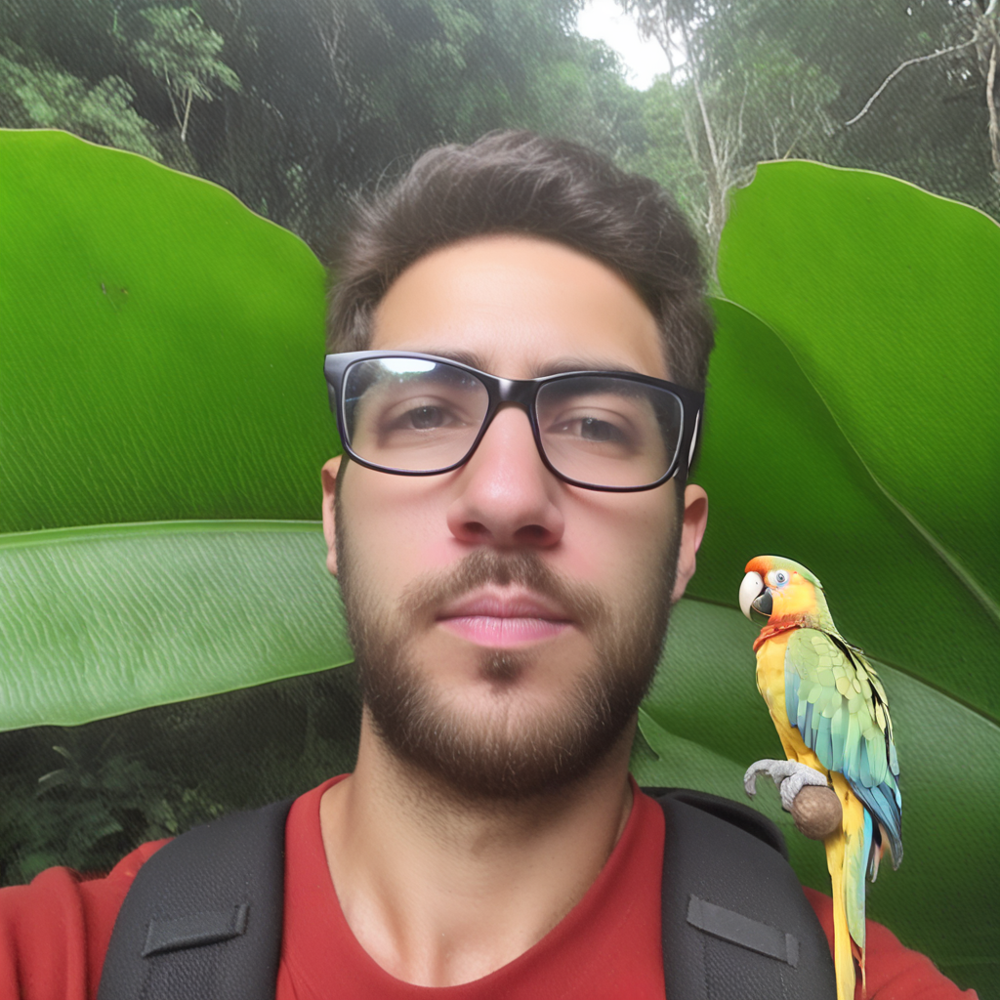

In [23]:
image = pipe("Myself exploring the Amazon, detailed jungle foliage around, a parrot on shoulder, the essence of adventure, ultradefined.", guidance_scale=7.5, num_inference_steps=50).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

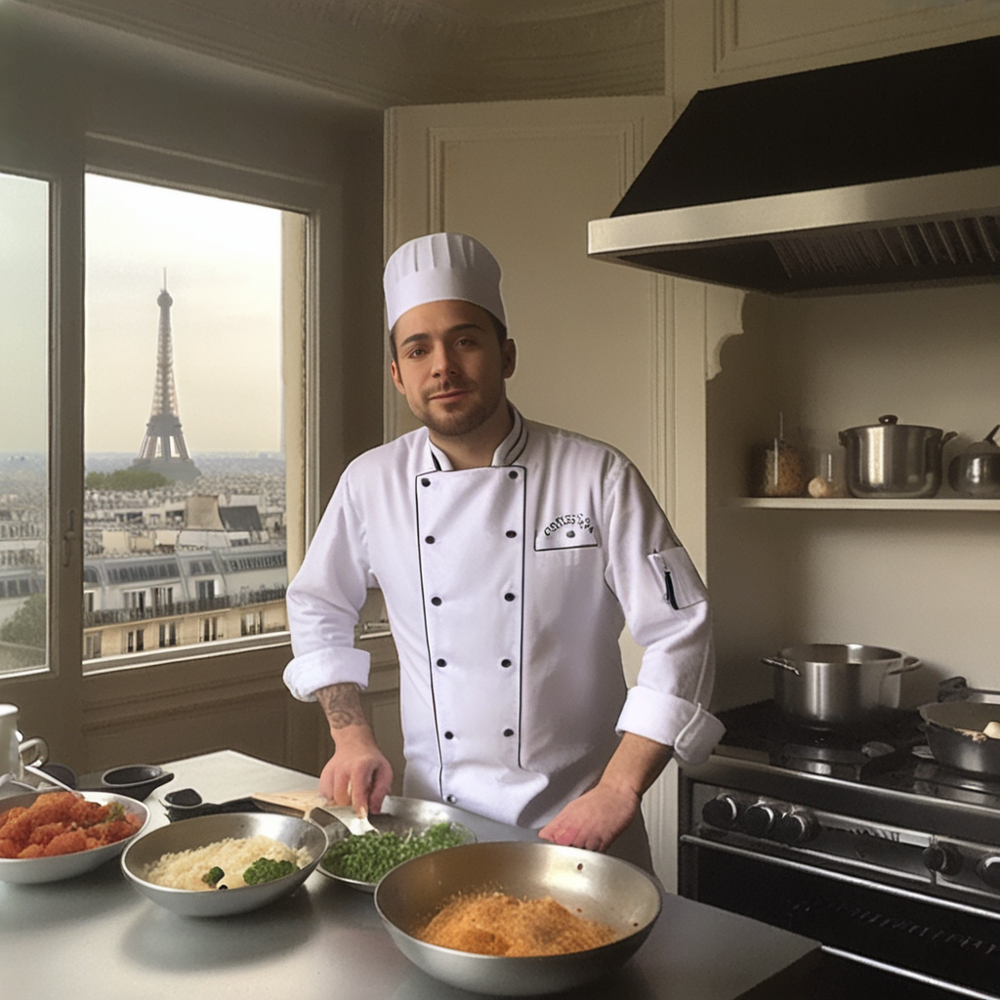

In [24]:
image = pipe("Me as a chef in a high-end Parisian kitchen, details of exquisite dishes being prepared, the Eiffel Tower visible outside.", guidance_scale=7.5, num_inference_steps=50).images[0]
image